<div style="width: 100%; overflow: hidden;">
    <a href="http://www.uc.pt/fctuc/dei/">
    <div style="display: block;margin-left: auto;margin-right: auto; width: 50%;"><img src="https://eden.dei.uc.pt/~naml/images_ecos/dei25.png"  /></div>
    </a>
</div>

## ACA - Project 2  
# We Want more Signs :)

In [8]:
import os
import numpy as np
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import utils, datasets, transforms
from PIL import Image
from torchvision.utils import save_image

from torchvision.datasets import ImageFolder
from pytorch_fid import fid_score
from torchsummary import summary

import time
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
import pickle

device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")

print(device)

mps


In [2]:
def set_seeds(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seeds(0)

In [3]:
def show_images(images):
    plt.figure(figsize=(8, 8))
    for i in range(images.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(np.transpose(images[i].detach().cpu().numpy(), (1, 2, 0)), interpolation='nearest')
        plt.axis('off')
    plt.show()
    
def generate_images(generator, num_images):
    with torch.no_grad():  
        noise = torch.randn(num_images, 100, 1, 1, device=device)  
        generated_images = generator(noise)
        generated_images = (generated_images + 1) / 2  # Rescale images from [-1, 1] to [0, 1]
        return generated_images

# 1. Load dataset

In [ ]:
train_dataset_path = 'TRAIN'

IMG_WIDTH = 75
IMG_HEIGHT = 75
BATCH_SIZE = 32

In [ ]:
transform = transforms.Compose([transforms.Resize((IMG_WIDTH, IMG_HEIGHT)), 
    transforms.ToTensor(),
    ])

dataset = datasets.ImageFolder(root=train_dataset_path, transform=transform)

data_loader = torch.utils.data.DataLoader(dataset, BATCH_SIZE, shuffle=False)

In [ ]:
dataiter_flattened = iter(data_loader)
images, labels = next(dataiter_flattened)
print(torch.min(images), torch.max(images))

In [ ]:
# AUXILIAR - convert dataloader to tensor
data_list4 = []
labels_list4 = []
for inputs, targets in data_loader:
    data_list4.append(inputs)
    labels_list4.append(targets)

data_tensor = torch.cat(data_list4)
labels_tensor = torch.cat(labels_list4)

### 1.1 Obtain File Names

In [ ]:
#obtain original file names
class ImageFolderWithPaths(ImageFolder):
    def __getitem__(self, index):
        # The image file path
        path = self.imgs[index][0]
        return os.path.basename(path)

datasetx = ImageFolderWithPaths("TRAIN", transform=None)

all_paths = [item for item in datasetx]

# 2. Model 1 - AutoEncoder

### 2.1 Architecture

In [6]:
class Autoencoder(nn.Module):
    def __init__(self, color_channels=3):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1),  # Output: [32, 38, 38]
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # Output: [64, 19, 19]
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Output: [128, 10, 10]
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1),  # Output: [64, 20, 20]
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1),  # Output: [32, 41, 41]
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=3, stride=2, padding=1),  # Output: [3, 83, 83]
            nn.ReLU(),
            nn.Conv2d(3, 3, kernel_size=1, stride=1, padding=1),  # Output: [3, 75, 75]
            nn.Sigmoid(),  # Use a sigmoid to ensure the output is between 0 and 1
        )

    # def forward(self, input):
    #     print(f'Input shape: {input.shape}')  # print the shape of the input
    #     for layer in self.encoder:
    #         input = layer(input)
    #         print(f'Output shape after encoder: {input.shape}')  # print the output shape after each layer
    #     for layer in self.decoder:
    #         input = layer(input)
    #         print(f'Output shape after decoder: {input.shape}')  # print the output shape after each layer
        # return input
    
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [7]:
#see layer shapes and bottleneck
model = Autoencoder(color_channels=3)

print("Encoder Summary:")
summary(model.encoder, (3, 75, 75))

print("\nDecoder Summary:")

summary(model.decoder, (128, 19, 19))

Encoder Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 38, 38]             896
              ReLU-2           [-1, 32, 38, 38]               0
            Conv2d-3           [-1, 64, 19, 19]          18,496
              ReLU-4           [-1, 64, 19, 19]               0
            Conv2d-5          [-1, 128, 10, 10]          73,856
              ReLU-6          [-1, 128, 10, 10]               0
Total params: 93,248
Trainable params: 93,248
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 1.25
Params size (MB): 0.36
Estimated Total Size (MB): 1.67
----------------------------------------------------------------

Decoder Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvT

### 2.2 Train the model

In [ ]:
def train(model, data_loader, num_epochs=50, device='cpu'):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(),
                                lr=0.0001) 

    model = model.to(device)
    
    outputs = []
    for epoch in range(num_epochs):
        for (img, _) in data_loader:

            img = img.to(device)
            recon = model(img)
            loss = criterion(recon, img)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f'Epoch:{epoch+1}, Loss:{loss.item():.4f}')
        outputs.append((epoch, img.to('cpu'), recon.to('cpu')))
         
    return model.to('cpu'), outputs

In [ ]:
num_epochs = 2000
model1 = Autoencoder()
model1, outputs = train(model1, data_loader, num_epochs=num_epochs, device=device)

Epoch:1, Loss:0.0558
Epoch:2, Loss:0.0556
Epoch:3, Loss:0.0553
Epoch:4, Loss:0.0547
Epoch:5, Loss:0.0535
Epoch:6, Loss:0.0512
Epoch:7, Loss:0.0484
Epoch:8, Loss:0.0472
Epoch:9, Loss:0.0465
Epoch:10, Loss:0.0454
Epoch:11, Loss:0.0440
Epoch:12, Loss:0.0427
Epoch:13, Loss:0.0411
Epoch:14, Loss:0.0391
Epoch:15, Loss:0.0366
Epoch:16, Loss:0.0338
Epoch:17, Loss:0.0316
Epoch:18, Loss:0.0297
Epoch:19, Loss:0.0281
Epoch:20, Loss:0.0265
Epoch:21, Loss:0.0252
Epoch:22, Loss:0.0240
Epoch:23, Loss:0.0230
Epoch:24, Loss:0.0223
Epoch:25, Loss:0.0218
Epoch:26, Loss:0.0214
Epoch:27, Loss:0.0211
Epoch:28, Loss:0.0208
Epoch:29, Loss:0.0206
Epoch:30, Loss:0.0204
Epoch:31, Loss:0.0202
Epoch:32, Loss:0.0200
Epoch:33, Loss:0.0198
Epoch:34, Loss:0.0196
Epoch:35, Loss:0.0195
Epoch:36, Loss:0.0193
Epoch:37, Loss:0.0191
Epoch:38, Loss:0.0190
Epoch:39, Loss:0.0188
Epoch:40, Loss:0.0187
Epoch:41, Loss:0.0185
Epoch:42, Loss:0.0184
Epoch:43, Loss:0.0182
Epoch:44, Loss:0.0181
Epoch:45, Loss:0.0179
Epoch:46, Loss:0.01

In [ ]:
reconstructed_images = []

for i, (inputs, _) in enumerate(data_loader):
    inputs = inputs.to(next(model1.parameters()).device)
    
    outputs = model1(inputs)
    outputs = outputs.detach().cpu()
    reconstructed_images.append(outputs)

reconstructed_images = torch.cat(reconstructed_images)

### 2.3 Preview the Results

In [ ]:
def plot_specific_images(original_images, reconstructed_images, indices):
    fig, axs = plt.subplots(2, len(indices), figsize=(20, 7))
    
    for i, image_index in enumerate(indices):
        # Plot original image
        original_image = original_images[image_index].detach().numpy()
        if original_image.ndim == 3:
            axs[0, i].imshow(np.transpose(original_image, (1,2,0)))
        else:
            print(f"Original image at index {image_index} does not have 3 dimensions.")
        axs[0, i].axis('off')

        # Plot reconstructed image
        reconstructed_image = reconstructed_images[image_index].detach().numpy()
        if reconstructed_image.ndim == 3:
            axs[1, i].imshow(np.transpose(reconstructed_image, (1,2,0)))
        else:
            print(f"Reconstructed image at index {image_index} does not have 3 dimensions.")
        axs[1, i].axis('off')


    fig.text(0.5, 0.9, "Original Images", ha='center', va='center', fontsize=20)
    fig.text(0.5, 0.4, "Reconstructed Images", ha='center', va='center', fontsize=20)

    plt.show()

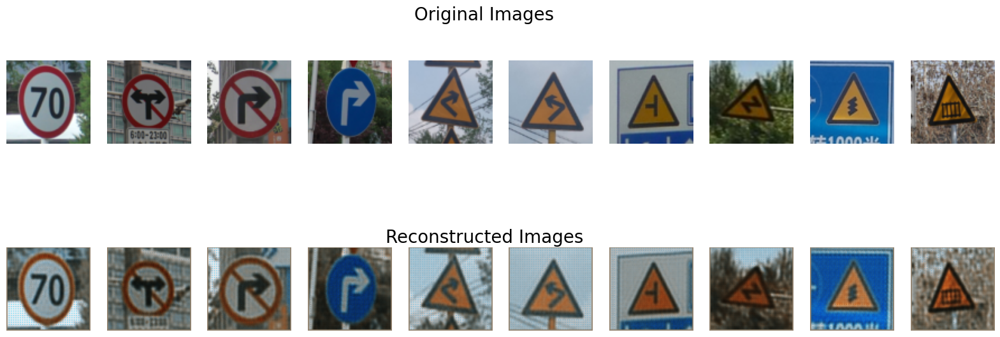

In [ ]:
plot_specific_images(data_tensor, reconstructed_images, [0, 80, 91, 100, 110, 140, 192, 210, 220, 223])

### 2.4 - Export Reconstructed Images

In [ ]:
def generate_filename(path, current_part=None, count=0):
    # Split the filename from its extension
    filename, extension = os.path.splitext(os.path.basename(path))

    # Split the filename into parts
    parts = filename.split('_')

    # Extract the first part
    first_part = parts[0]

    # Check if the first part has changed
    if first_part != current_part:
        # Reset the count and update the current part
        count = 1
        current_part = first_part
    else:
        # Increment the count
        count += 1

    # Generate the new filename
    new_filename = f"{first_part}_2_{str(count).zfill(4)}{extension}"

    return new_filename, current_part, count
# 
os.makedirs("reconstructed_images", exist_ok=True)

current_part = None
count = 0

for img, path in zip(reconstructed_images, all_paths):
    img = Image.fromarray((img.permute(1, 2, 0).numpy() * 255).astype(np.uint8))
    new_filename, current_part, count = generate_filename(path, current_part, count)
    img.save(f"reconstructed_images/{new_filename}")

# 3. Model 2 - Vanilla-GAN

### 3.1 Reshape Dataloader

In [5]:
BATCH_SIZE = 128
ROOT = 'TRAIN'

In [6]:
transform = transforms.Compose([
    transforms.Resize((80, 80)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  
])

dataset = datasets.ImageFolder(root=ROOT, transform=transform)
dataset_loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

### 3.2 Achitecture 

In [7]:
#### GENERATOR
#(Input, Output, Kernel, Stride, Padding)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(100, 1024, 4, 1, 0, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(True),

            nn.ConvTranspose2d(1024, 512, 4, 1, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

    #PARA AJUSTAR AS SHAPES
    # def forward(self, input):
    #     for layer in self.main:
    #         input = layer(input)
    #         print(input.shape)  # print the output shape after each layer
    #     return input

In [49]:
#PARA AJUSTAR AS SHAPES
# from torchsummary import summary
# model = Generator()
# summary(model, (100, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       1,638,400
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
              ReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4            [-1, 512, 5, 5]       8,388,608
       BatchNorm2d-5            [-1, 512, 5, 5]           1,024
              ReLU-6            [-1, 512, 5, 5]               0
   ConvTranspose2d-7          [-1, 256, 10, 10]       2,097,152
       BatchNorm2d-8          [-1, 256, 10, 10]             512
              ReLU-9          [-1, 256, 10, 10]               0
  ConvTranspose2d-10          [-1, 128, 20, 20]         524,288
      BatchNorm2d-11          [-1, 128, 20, 20]             256
             ReLU-12          [-1, 128, 20, 20]               0
  ConvTranspose2d-13           [-1, 64, 40, 40]         131,072
      BatchNorm2d-14           [-1, 64,

In [ ]:
# ## PARA VER AS SHAPES DO GENERATOR E AJUSTAR O DISCRIMINATOR
# # Create an instance of the Generator class
# gen = Generator()

# # Create a random input tensor
# input_tensor = torch.randn(1, 100, 1, 1)

# # Call the forward method
# output = gen.forward(input_tensor)

In [8]:
#### DISCRIMINATOR
#(Input, Output, Kernel, Stride, Padding)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 1, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.5),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.4),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.4),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(512, 1024, 4, 2, 1, bias=False),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(1024, 1, 4, 2, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
            return self.model(input).view(-1, 1).squeeze(1)
    
    #PARA AJUSTAR AS SHAPES
    # def forward(self, input):
    #     print(f'Input shape: {input.shape}')  # print the shape of the input
    #     for layer in self.model:
    #         input = layer(input)
    #         print(f'Output shape: {input.shape}')  # print the output shape after each layer
    #     final_output = input.view(-1, 1).squeeze(1)
    #     print(f'Final output shape: {final_output.shape}')  # print the shape of the final output
    #     return final_output

In [51]:
# from torchsummary import summary
# model = Discriminator()
# summary(model, (3, 80, 80))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 79, 79]           3,072
         LeakyReLU-2           [-1, 64, 79, 79]               0
           Dropout-3           [-1, 64, 79, 79]               0
            Conv2d-4          [-1, 128, 39, 39]         131,072
       BatchNorm2d-5          [-1, 128, 39, 39]             256
         LeakyReLU-6          [-1, 128, 39, 39]               0
           Dropout-7          [-1, 128, 39, 39]               0
            Conv2d-8          [-1, 256, 19, 19]         524,288
       BatchNorm2d-9          [-1, 256, 19, 19]             512
        LeakyReLU-10          [-1, 256, 19, 19]               0
          Dropout-11          [-1, 256, 19, 19]               0
           Conv2d-12            [-1, 512, 9, 9]       2,097,152
      BatchNorm2d-13            [-1, 512, 9, 9]           1,024
        LeakyReLU-14            [-1, 51

In [ ]:
# ## PARA VER AS SHAPES DO DISCRIMINATOR E AJUSTAR O DATA LOADER
#disc = Discriminator()

# Create a random input tensor that matches the output shape of the generator
#input_tensor = torch.randn(128, 3, 80, 80)

# Call the forward method
#output = disc.forward(input_tensor)

In [9]:
netG = Generator().to(device)
netD = Discriminator().to(device)

optimizerD = optim.Adam(netD.parameters(), lr=0.0001, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.001, betas=(0.5, 0.999))

### 3.3 Train the model

In [ ]:
criterion = nn.BCELoss()

real_label = 0.95
fake_label = 0.05
num_epochs = 3000

for epoch in range(num_epochs):
    for i, (data, _) in enumerate(dataset_loader):
        netD.zero_grad()
        real_cpu = data.to(device)
        batch_size = real_cpu.size(0)
        label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)

        output = netD(real_cpu)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, 100, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)

        output = netD(fake.detach())
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        errD = errD_real + errD_fake
        optimizerD.step()

        # Update G: Maximize log(D(G(z)))
        netG.zero_grad()
        noise = torch.randn(batch_size, 100, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(real_label)  
        output = netD(fake)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataset_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        if epoch % 200 == 0:
            noise = torch.randn(batch_size, 100, 1, 1, device=device)
            # Generate fake image batch with G
            with torch.no_grad():
                fake = netG(noise).detach().cpu()
                fake = (fake + 1) / 2
            # Save the generated images
            save_image(fake, f'/content/drive/MyDrive/NAMZ/sample/fake_images_epoch_{epoch+1}.png')

            # Save the weights of the generator and discriminator
            torch.save(netG.state_dict(), f'/content/drive/MyDrive/NAMZ/weights/netG_epoch_1_{epoch+1}.pth')
            torch.save(netD.state_dict(), f'/content/drive/MyDrive/NAMZ/weights/netD_epoch_1_{epoch+1}.pth')

print("Training complete.")

[0/3000][0/5]	Loss_D: 1.4718	Loss_G: 0.8911	D(x): 0.4988	D(G(z)): 0.5130 / 0.4085
[1/3000][0/5]	Loss_D: 1.3494	Loss_G: 1.1791	D(x): 0.5721	D(G(z)): 0.4883 / 0.2931
[2/3000][0/5]	Loss_D: 1.3692	Loss_G: 1.5648	D(x): 0.5450	D(G(z)): 0.4600 / 0.1924
[3/3000][0/5]	Loss_D: 1.2834	Loss_G: 1.9270	D(x): 0.5728	D(G(z)): 0.4307 / 0.1327
[4/3000][0/5]	Loss_D: 1.1714	Loss_G: 2.3532	D(x): 0.6129	D(G(z)): 0.3972 / 0.0805
[5/3000][0/5]	Loss_D: 1.1255	Loss_G: 2.4610	D(x): 0.6272	D(G(z)): 0.3692 / 0.0731
[6/3000][0/5]	Loss_D: 1.1071	Loss_G: 2.5237	D(x): 0.6016	D(G(z)): 0.3254 / 0.0681
[7/3000][0/5]	Loss_D: 1.1121	Loss_G: 2.8855	D(x): 0.6712	D(G(z)): 0.4119 / 0.0460
[8/3000][0/5]	Loss_D: 1.0706	Loss_G: 2.8470	D(x): 0.5983	D(G(z)): 0.2941 / 0.0484
[9/3000][0/5]	Loss_D: 1.0302	Loss_G: 3.2870	D(x): 0.6941	D(G(z)): 0.3660 / 0.0294
[10/3000][0/5]	Loss_D: 0.9929	Loss_G: 3.5141	D(x): 0.7301	D(G(z)): 0.3706 / 0.0227
[11/3000][0/5]	Loss_D: 0.9187	Loss_G: 3.1521	D(x): 0.6870	D(G(z)): 0.2722 / 0.0360
[12/3000][0/5]

KeyboardInterrupt: 

### 3.5 Evaluate the Results

How to interpret the FID score based on the paper [\[1\]](https://arxiv.org/abs/1706.08500)


- Lower scores indicate the two groups of images are more similar, or have more similar statistics.
- A higher FID score indicates that the two sets of images are more dissimilar. There's no upper limit to the FID score.

In [ ]:
real_images_dirs = ["TRAIN_ORIGINAL/6", "TRAIN_ORIGINAL/12", "TRAIN_ORIGINAL/13",
                       "TRAIN_ORIGINAL/24", "TRAIN_ORIGINAL/38", "TRAIN_ORIGINAL/39",
                       "TRAIN_ORIGINAL/44", "TRAIN_ORIGINAL/46", "TRAIN_ORIGINAL/49"]

fake_images_dirs = ["GAN_06", "GAN_12", "GAN_13",
                       "GAN_24", "GAN_38", "GAN_39",
                       "GAN_44", "GAN_46", "GAN_49"]

fid_scores = {}


for real_dir, fake_dir in zip(real_images_dirs, fake_images_dirs):
    real_path = os.path.join(real_dir)
    fake_path = os.path.join(fake_dir)

    fid = fid_score.calculate_fid_given_paths([real_path, fake_path], 
                                              batch_size=50, 
                                              device=device,
                                              dims=64) #USE ONLY 64, 192, 768, or 2048.

    # Append FID score to dictionary with a simpler key
    fid_scores[(real_dir, fake_dir)] = fid

# Save fid_scores dictionary
with open('fid_scores.pkl', 'wb') as f:
    pickle.dump(fid_scores, f)

In [10]:
with open('fid_scores.pkl', 'rb') as f:
    fid_scores = pickle.load(f)

fid_scores

{('TRAIN_ORIGINAL/6', 'GAN_06'): 1.554791840286411,
 ('TRAIN_ORIGINAL/12', 'GAN_12'): 1.8794891620003185,
 ('TRAIN_ORIGINAL/13', 'GAN_13'): 2.031828528556246,
 ('TRAIN_ORIGINAL/24', 'GAN_24'): 0.8029057294224105,
 ('TRAIN_ORIGINAL/38', 'GAN_38'): 0.8245052314930588,
 ('TRAIN_ORIGINAL/39', 'GAN_39'): 0.8705218106771069,
 ('TRAIN_ORIGINAL/44', 'GAN_44'): 1.3914787085907712,
 ('TRAIN_ORIGINAL/46', 'GAN_46'): 1.0698728172489087,
 ('TRAIN_ORIGINAL/49', 'GAN_49'): 0.9815059817927168,
 ('TRAIN_ORIGINAL/50', 'GAN_50'): 0.6494608769984188}

### 3.6 Reproduce results and Export Images

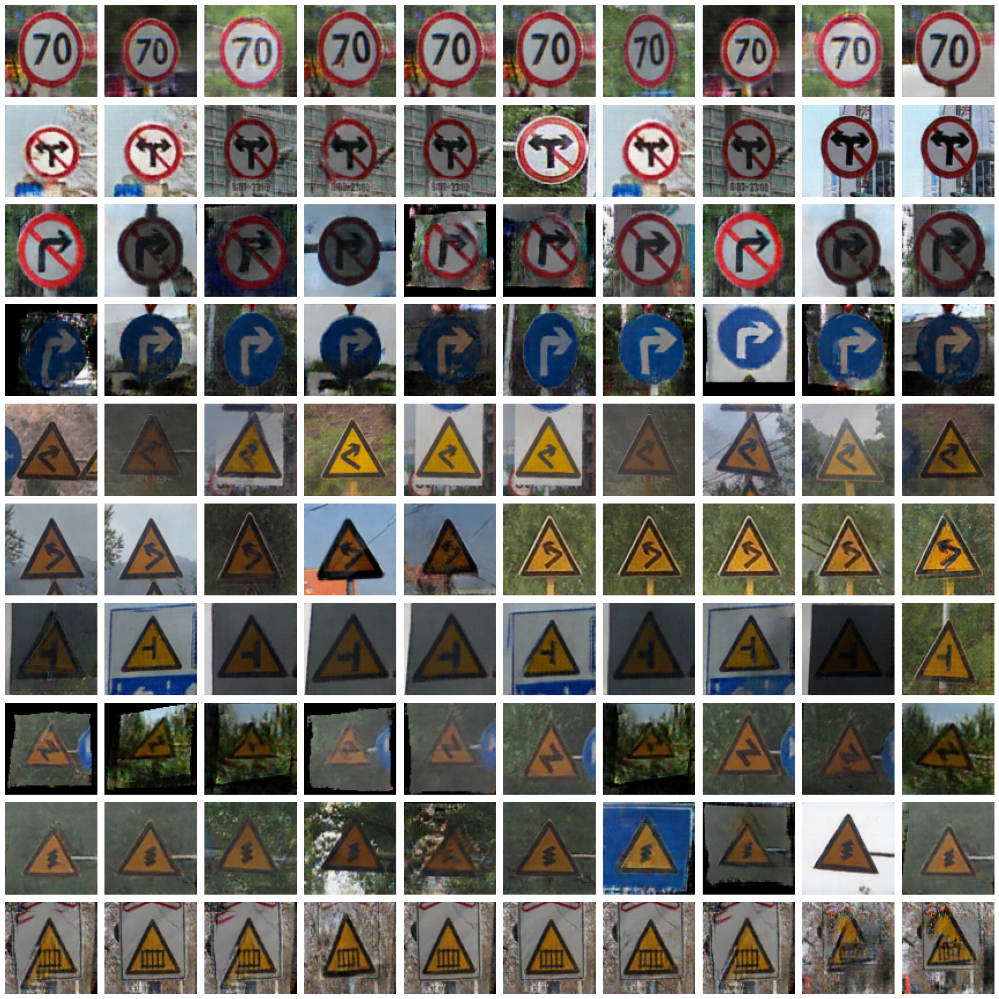

In [12]:
# Define the generator
netG = Generator().to(device)

# List of weights
weights = ['weights/06/better/netG.pth', 'weights/12/netG_epoch_2801.pth', 'weights/13/netG_epoch_2601.pth', 'weights/24/netG_epoch_2401.pth', 'weights/38/netG_epoch_3001.pth', 
           'weights/39/netG_epoch_3001.pth', 'weights/44/netG_epoch_3001.pth', 'weights/46/netG2_epoch_2601.pth', 'weights/49/netG_epoch_1_2401.pth', 'weights/50/netG_epoch_1_4801.pth']

# Number of images per class
images_per_class = 10

# Initialize a figure for plotting
fig, axs = plt.subplots(len(weights), images_per_class, figsize=(images_per_class*2, len(weights)*2))

# Load each weight and generate images
for i, weight in enumerate(weights):
    # Load the weights
    netG.load_state_dict(torch.load(weight, map_location=device))

    # Convert the model weights to float
    netG = netG.float()

    # Set the generator to evaluation mode
    netG.eval()

    with torch.no_grad():
        # Generate noise
        noise = torch.randn(images_per_class, 100, 1, 1, device=device)
        noise = noise.float()  # Convert the noise tensor to float

        # Generate images
        generated_images = netG(noise)

        # Normalize the images back to [0, 1]
        generated_images = (generated_images + 1) / 2

        # Plot the generated images
        for j, image in enumerate(generated_images):
            axs[i, j].imshow(image.cpu().detach().numpy().transpose(1, 2, 0))
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()

In [119]:
batch = 118

netG = Generator().to(device)

# Load the weights
netG.load_state_dict(torch.load('weights/50/netG_epoch_1_4801.pth', map_location=device))

# Convert the model weights to float
netG = netG.float()
netG.eval()

with torch.no_grad():
    noise = torch.randn(batch, 100, 1, 1, device=device)
    noise = noise.float()
    generated_images = netG(noise)

In [120]:
# Define the directory to save the images
save_dir = 'GAN_50'
os.makedirs(save_dir, exist_ok=True)

images = generated_images.detach().cpu().numpy()

# Rescale the values from [-1, 1] to [0, 1]
images = 0.5 * images + 0.5

# Save the images
for i in range(images.shape[0]):
    img = np.transpose(images[i], (1, 2, 0))
    plt.imsave(os.path.join(save_dir, f'50_04_{i}.png'), img)

# 4. Model3 - Conditional Deep Convolutional GAN

The CDCGAN architecture, in table ,  was adapted from the following repository [\[2\]](https://github.com/XavierJiezou/pytorch-cdcgan-mnist). Although, this project was originally implemented for the MNIST dataset, which consists of grayscale images, we had to modify the code to handle multidimensional inputs for our colored images. We increased the number of filters to 1024 and adjusted the convolutional output shapes. We also applied the lessons learned from our vanilla-GAN

In [17]:
# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 80

# Number of channels in the training images. 
nc = 3

# Number of classes in the training images. For mnist dataset this is 10
num_classes = 10

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 256

# Size of feature maps in discriminator
ndf = 128

# Number of training epochs
num_epochs = 200

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

### 4.1 Achitecture 

In [18]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.image = nn.Sequential(
            # state size. (nz) x 1 x 1
            nn.ConvTranspose2d(nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True)
            # state size. (ngf*4) x 4 x 4
        )
        self.label = nn.Sequential(
            # state size. (num_classes) x 1 x 1
            nn.ConvTranspose2d(num_classes, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True)
            # state size. (ngf*4) x 4 x 4
        )
        self.main = nn.Sequential(
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, ngf//2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf//2),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf//2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, image, label):
        image = self.image(image)
        label = self.label(label)
        incat = torch.cat((image, label), dim=1)
        return self.main(incat)
    

In [19]:
from torchsummary import summary

# Create an instance of the Generator
model = Generator()
 
# Print the summary of the model
summary(model, [(100, 1, 1), (num_classes, 1, 1)])


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       1,638,400
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
              ReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4           [-1, 1024, 4, 4]         163,840
       BatchNorm2d-5           [-1, 1024, 4, 4]           2,048
              ReLU-6           [-1, 1024, 4, 4]               0
   ConvTranspose2d-7           [-1, 1024, 5, 5]      33,554,432
       BatchNorm2d-8           [-1, 1024, 5, 5]           2,048
              ReLU-9           [-1, 1024, 5, 5]               0
  ConvTranspose2d-10          [-1, 512, 10, 10]       8,388,608
      BatchNorm2d-11          [-1, 512, 10, 10]           1,024
             ReLU-12          [-1, 512, 10, 10]               0
  ConvTranspose2d-13          [-1, 256, 20, 20]       2,097,152
      BatchNorm2d-14          [-1, 256,

In [20]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.image = nn.Sequential(
            # input is (nc) x 80 x 80
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
            # state size. (ndf) x 16 x 16
        )
        self.label = nn.Sequential(
            # input is (num_classes) x 32 x 32
            nn.Conv2d(num_classes, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
            # state size. (ndf) x 16 x 16
        )
        self.main = nn.Sequential(
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),

            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),

            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, ndf * 8, 4, 2, 0, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.1),
            nn.Dropout(0.2),

            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, image, label):
        image = self.image(image)
        label = self.label(label)
        incat = torch.cat((image, label), dim=1)
        return self.main(incat)

In [21]:
# Create an instance of the Discriminator
model = Discriminator()

# Print the summary of the model
summary(model, [(nc, 80, 80), (num_classes, 80, 80)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 40, 40]           6,144
         LeakyReLU-2          [-1, 128, 40, 40]               0
            Conv2d-3          [-1, 128, 40, 40]          20,480
         LeakyReLU-4          [-1, 128, 40, 40]               0
            Conv2d-5          [-1, 512, 20, 20]       2,097,152
       BatchNorm2d-6          [-1, 512, 20, 20]           1,024
         LeakyReLU-7          [-1, 512, 20, 20]               0
           Dropout-8          [-1, 512, 20, 20]               0
            Conv2d-9         [-1, 1024, 10, 10]       8,388,608
      BatchNorm2d-10         [-1, 1024, 10, 10]           2,048
        LeakyReLU-11         [-1, 1024, 10, 10]               0
          Dropout-12         [-1, 1024, 10, 10]               0
           Conv2d-13           [-1, 1024, 4, 4]      16,777,216
      BatchNorm2d-14           [-1, 102

In [22]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Create the generator
netG = Generator().to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netG.apply(weights_init)

# Create the Discriminator
netD = Discriminator().to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netD.apply(weights_init)

Discriminator(
  (image): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (label): Sequential(
    (0): Conv2d(10, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (main): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Dropout(p=0.2, inplace=False)
    (8): Conv2d(1024, 1024, kernel_size=(4, 4), stride=(2, 2), bias=False)
    (9): 

In [23]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Establish convention for real and fake labels during training
real_label_num = 1.
fake_label_num = 0.

# Setup Adam optimizers for both G and D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Label one-hot for G
label_1hots = torch.zeros(10,10)
for i in range(10):
    label_1hots[i,i] = 1
label_1hots = label_1hots.view(10,10,1,1).to(device)

# Label one-hot for D
label_fills = torch.zeros(10, 10, image_size, image_size)
ones = torch.ones(image_size, image_size)
for i in range(10):
    label_fills[i][i] = ones
label_fills = label_fills.to(device)

# Create batch of latent vectors and laebls that we will use to visualize the progression of the generator
fixed_noise = torch.randn(100, nz, 1, 1).to(device)
fixed_label = label_1hots[torch.arange(10).repeat(10).sort().values]

### 4.2 Train the model

In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
D_x_list = []
D_z_list = []
loss_tep = 10

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):

    beg_time = time.time()
    # For each batch in the dataloader
    for i, data in enumerate(dataset_loader):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        
        # Format batch
        real_image = data[0].to(device)
        b_size = real_image.size(0)

        real_label = torch.full((b_size,), real_label_num).to(device)
        fake_label = torch.full((b_size,), fake_label_num).to(device)
        
        G_label = label_1hots[data[1]]
        D_label = label_fills[data[1]]
        
        # Forward pass real batch through D
        output = netD(real_image, D_label).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, real_label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1).to(device)
        # Generate fake image batch with G
        fake = netG(noise, G_label)
        # Classify all fake batch with D
        output = netD(fake.detach(), D_label).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, fake_label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake, D_label).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, real_label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        end_time = time.time()
        run_time = round(end_time-beg_time)
        print(
            f'Epoch: [{epoch+1:0>{len(str(num_epochs))}}/{num_epochs}]',
            f'Step: [{i+1:0>{len(str(len(dataset_loader)))}}/{len(dataset_loader)}]',
            f'Loss-D: {errD.item():.4f}',
            f'Loss-G: {errG.item():.4f}',
            f'D(x): {D_x:.4f}',
            f'D(G(z)): [{D_G_z1:.4f}/{D_G_z2:.4f}]',
            f'Time: {run_time}s',
            end='\r'
        )

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Save D(X) and D(G(z)) for plotting later
        D_x_list.append(D_x)
        D_z_list.append(D_G_z2)

            # Check if this is the 10th epoch
            
    if (epoch + 1) % 1 == 0:
        # Generate a batch of noise vectors for each class
        noise = torch.randn(num_classes * 10, nz, 1, 1).to(device)
        # Generate a batch of labels where each label is repeated 10 times
        labels = torch.arange(num_classes).repeat(10).to(device)
        G_label = label_1hots[labels]
        # Generate fake image batch with G
        with torch.no_grad():
            fake = netG(noise, G_label).detach().cpu()
        # Normalize the images to [0, 1]
        fake = (fake + 1) / 2
        # Save the generated images
        save_image(fake, f'epoch_samples/fake_images_epoch_{epoch+1}.png', nrow=10)

        
        # # Save the Best Model
        # if errG < loss_tep:
        #     torch.save(netG.state_dict(), '/content/drive/MyDrive/weights/weights.pt')
        #     loss_tep = errG
        
    # # Check how the generator is doing by saving G's output on fixed_noise and fixed_label
    # if epoch % 10 == 0:
    #     with torch.no_grad():
    #         fake = netG(fixed_noise, fixed_label).detach().cpu()
    #     img_list.append(utils.make_grid(fake, nrow=10))

    # Next line
    print("")
    


### 4.3 Reproduce results and Export Images

In [24]:
# Load the Best Generative Model
netG = Generator().to(device)
netG.load_state_dict(torch.load('weights/dcgan/netG_1024.pt', map_location=device))
netG.eval()

Generator(
  (image): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (label): Sequential(
    (0): ConvTranspose2d(10, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): ConvTranspose2d(2048, 1024, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padd

In [41]:
# Set the class you want to generate
class_to_generate = 9
b_size = 10

# Get the one-hot encoding and filled version of the class_to_generate
G_label = label_1hots[class_to_generate].unsqueeze(0).expand(b_size, -1, 1, 1)
D_label = label_fills[class_to_generate]

# Generate batch of latent vectors
noise = torch.randn(b_size, nz, 1, 1).to(device)

# Generate fake image batch with G
fake = netG(noise, G_label)

# Normalize the images back to [0, 1]
fake = (fake + 1) / 2

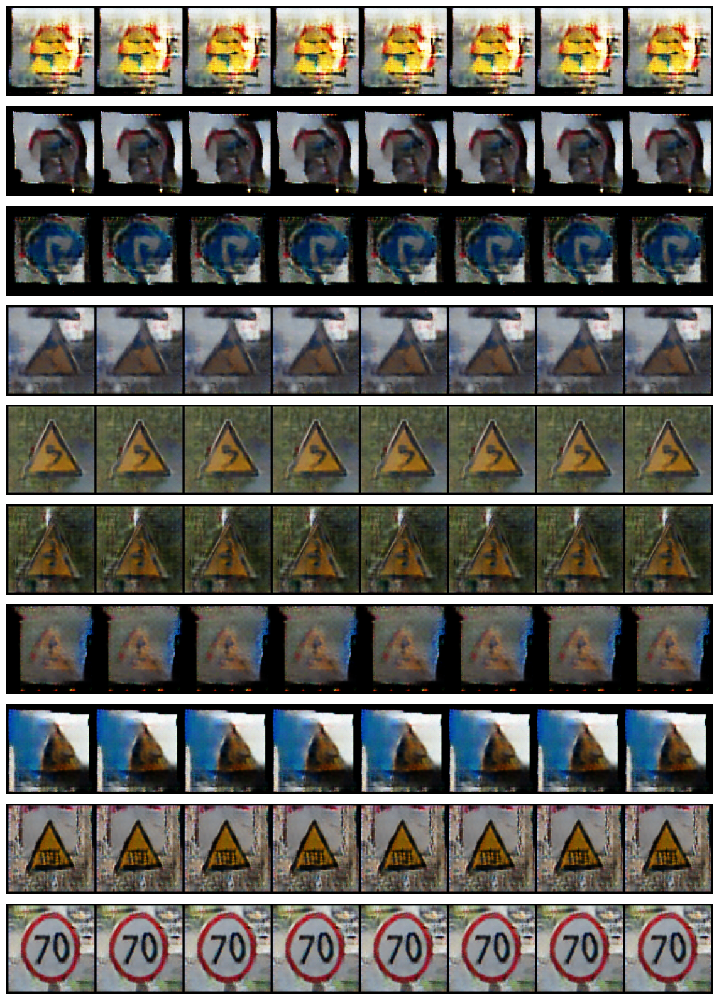

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils

fig, axs = plt.subplots(10, figsize=(16, 16))

for class_to_generate in range(10):
    # Get the one-hot encoding and filled version of the class_to_generate
    G_label = label_1hots[class_to_generate].unsqueeze(0).expand(b_size, -1, 1, 1)

    # Generate batch of latent vectors
    noise = torch.randn(b_size, nz, 1, 1).to(device)

    # Generate fake image batch with G
    fake = netG(noise, G_label)

    # Normalize the images back to [0, 1]
    fake = (fake + 1) / 2

    # Move the tensor to cpu and convert to numpy
    fake_images = fake.detach().cpu()

    # Create a grid of images
    grid = torchvision.utils.make_grid(fake_images, nrow=8)  # Adjust nrow as needed

    # Convert the tensor to numpy and adjust dimensions
    grid = np.transpose(grid.numpy(), (1, 2, 0))

    # Display the grid of images
    axs[class_to_generate].imshow(grid)
    axs[class_to_generate].axis('off')

plt.tight_layout()
plt.show()

# Citations

Lourenço, N. (2024). AML-2024-PROJECT2. Kaggle. https://kaggle.com/competitions/aml-2024-project-2, accessed in May 2024.

Heusel, M., Ramsauer, H., Unterthiner, T., Nessler, B., & Hochreiter, S. (2017). Gans trained by a two time-scale update rule converge to a local nash equilibrium. Advances in neural information processing systems, 30.

https://github.com/XavierJiezou/pytorch-cdcgan-mnist, accessed in May 2024.